In [68]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.pyplot import rcParams
import celerite
from celerite import terms
from celerite.modeling import Model
import warnings
warnings.filterwarnings('ignore')

import re
import jax.numpy as jnp
from jax import grad, jit, partial
import ticktack
from ticktack import fitting
from astropy.table import Table
from tqdm import tqdm
from jax.ops import index_update

rcParams['figure.figsize'] = (10.0, 5.0)

In [2]:
@jit
def sine(t, param):
    prod =  cf.steady_state_production + 0.18 * cf.steady_state_production * jnp.sin(2 * np.pi / 11 * t)
    return prod

Text(0, 0.5, 'd14c')

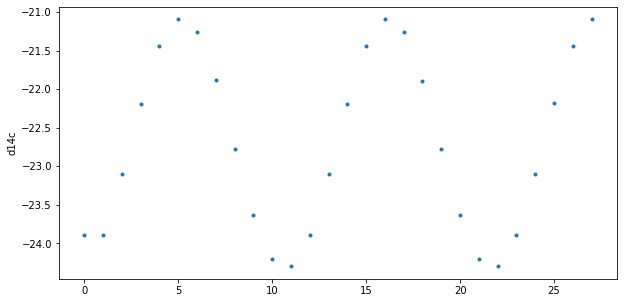

In [9]:
cbm = ticktack.load_presaved_model('Guttler14', production_rate_units = 'atoms/cm^2/s')
cf = fitting.CarbonFitter(cbm)
cf.load_data('inject-recovery.csv')
plt.plot(cf.d14c_data, ".")
plt.ylabel("d14c")

Text(0, 0.5, 'd14c')

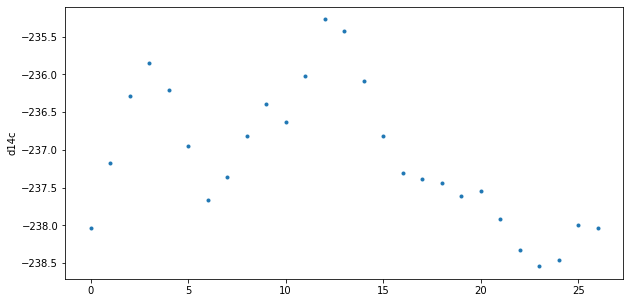

In [16]:
np.random.seed(42)
initial = jnp.array(np.random.rand(len(cf.d14c_data)))
cf.prepare_function(use_control_points=True, control_points=initial)
plt.plot(cf.dc14(initial), ".")
plt.ylabel("d14c")

In [17]:
sampler = cf.sampling(initial, burnin=300, production=500, log_like=True)

Running burn-in...


100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [02:41<00:00,  1.86it/s]


Running production...


100%|█████████████████████████████████████████████████████████████████████████████████| 500/500 [04:30<00:00,  1.85it/s]


Text(0.5, 1.0, 'Production Rate')

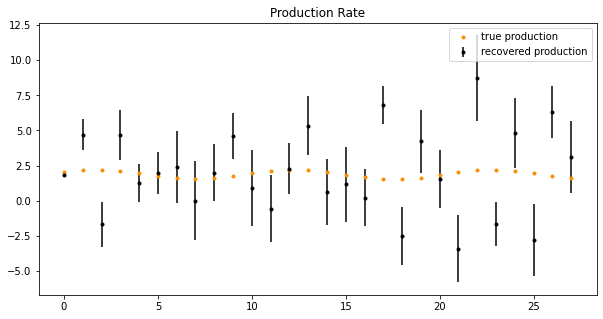

In [50]:
placeholder = [0]
recover_prod = np.mean(sampler.flatchain, axis=0)
recover_error = np.std(sampler.flatchain, axis=0)
true_prod = sine(np.linspace(760, 788, num=len(initial), endpoint=True), placeholder)
plt.errorbar(np.arange(len(recover_prod)), recover_prod, yerr=recover_error, fmt=".k")
plt.plot(true_prod, ".", color="darkorange")
plt.legend(['true production', 'recovered production'])
plt.title("Production Rate")

Text(0.5, 1.0, 'd14c data')

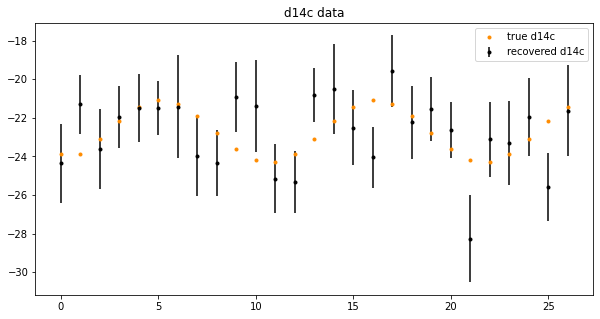

In [54]:
n = 3000
arr = np.zeros((n, 27))
ind = np.random.permutation(sampler.flatchain.shape[0])[:n]
for i in range(len(ind)):
    arr[i, :] = cf.dc14(sampler.flatchain[ind[i], :])
d14c_error = np.std(arr, axis=0)
true_d14c = cf.d14c_data
recover_d14c = np.mean(arr, axis=0)
plt.plot(true_d14c[:-1], ".", color="darkorange")
plt.errorbar(np.arange(len(recover_d14c)), recover_d14c, yerr=d14c_error, fmt=".k")
plt.legend(['true d14c', 'recovered d14c'])
plt.title("d14c data")

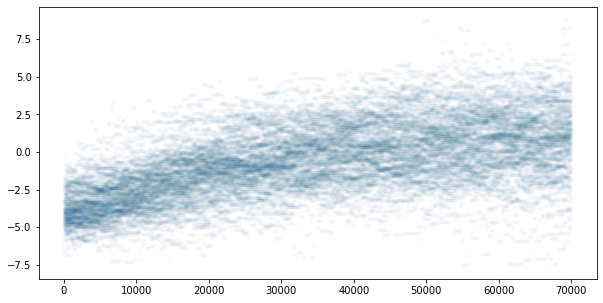

In [47]:
plt.plot(sampler.flatchain[:, 11], ".", alpha=0.01)

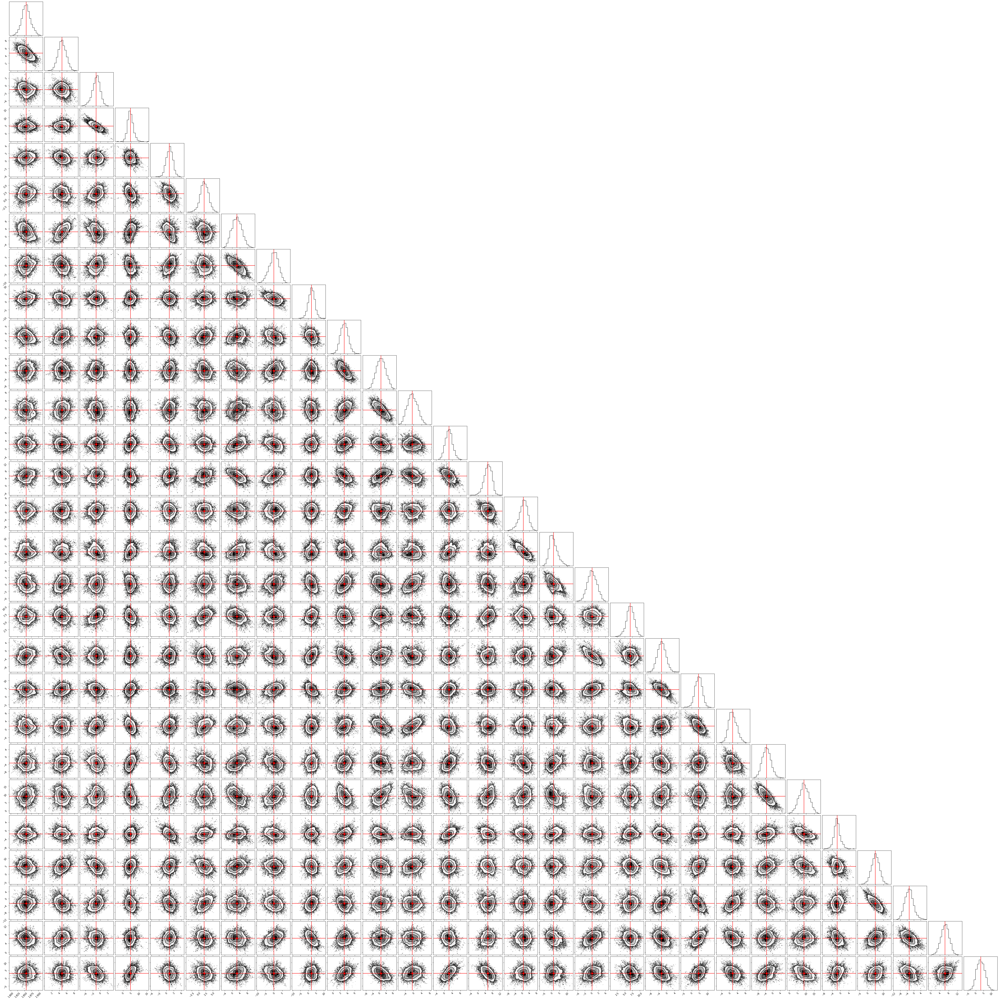

In [55]:
cf.corner_plot(sampler, save=True)

In [62]:
steady_state = cf.steady_state_production*jnp.ones((28,))
cf.grad_log_like(steady_state)

DeviceArray([-2.16497666,  1.78256304,  2.60349017,  2.74935072,
              2.09225576,  0.54827762, -1.60961694, -2.93965533,
             -3.56326632, -3.43031529, -2.57027016, -1.2587037 ,
              0.32969335,  1.81870182,  2.2515558 ,  1.65073963,
              0.23651646, -1.82900835, -3.18910683, -3.79980429,
             -3.48334413, -2.26614935, -0.94181512,  0.28353085,
              1.10344875,  1.25530456,  0.76807895,  0.12505218],            dtype=float64)

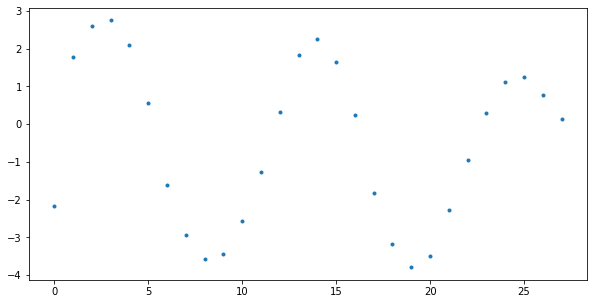

In [64]:
plt.plot(cf.grad_log_like(steady_state), ".")

In [ ]:
control_points = steady_state
for j in tqdm(range(100)):
    control_points -= 1e-3*cf.grad_log_like(control_points)
    control_points = index_update(control_points, control_points<0, 0)   

 11%|█████████                                                                         | 11/100 [00:04<00:35,  2.51it/s]